# Simple Visualizations

In [10]:
import sys, os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1" 
import avstack
import avapi

%load_ext autoreload
%autoreload 2
%matplotlib inline

data_root_dir = './data'
data_dir_kitti_obj = os.path.join(data_root_dir, 'KITTI/object')
data_dir_kitti_raw = os.path.join(data_root_dir, 'KITTI/raw')
data_dir_nuscenes  = os.path.join(data_root_dir, 'nuScenes')
data_dir_carla     = os.path.join(data_root_dir, 'CARLA/carla-object-v1')
data_dir_carla_collab = os.path.join(data_root_dir, 'CARLA/carla-collaborative-v2')

KSM = avapi.kitti.KittiScenesManager(data_dir_kitti_obj, data_dir_kitti_raw, convert_raw=False)
NSM = avapi.nuscenes.nuScenesManager(data_dir_nuscenes, split='v1.0-mini')
CSM = avapi.carla.CarlaScenesManager(data_dir_carla, verbose=False)
CSM_collab = avapi.carla.CarlaScenesManager(data_dir_carla_collab, verbose=False)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
def view_ego_data(DM, frame, flipx=False, flipy=False, flipxy=False):
    img = DM.get_image(frame, sensor='main_camera')
    objs = DM.get_objects(frame, sensor='main_lidar', whitelist_types='all')
    pc = DM.get_lidar(frame, sensor='main_lidar', filter_front=False)

    # -- view image
    avapi.visualize.show_image_with_boxes(img, objs, inline=True, box_colors='white')

    # -- view lidar bev
    extent = [[-50,50], [-30,30], [-10, 10]]  # this is always in standard coordinates
    avapi.visualize.show_lidar_bev_with_boxes(pc, [obj.box for obj in objs],
                          extent=extent, box_colors='white', flipx=flipx, flipy=flipy, flipxy=flipxy)
    return objs

## KITTI

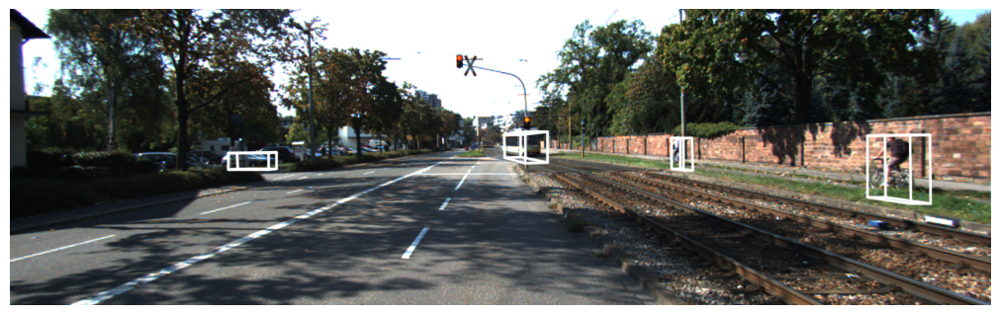

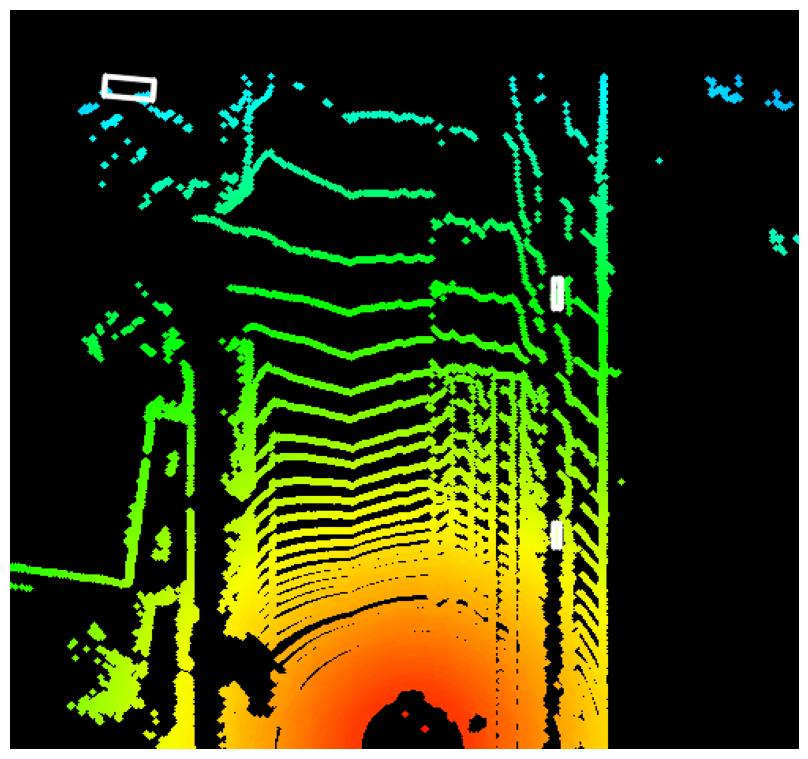

In [3]:
scene = 0
frame = 80
KDM = KSM.get_scene_dataset_by_index(scene)
objs = view_ego_data(KDM, frame, flipx=True, flipy=True, flipxy=True)

## nuScenes

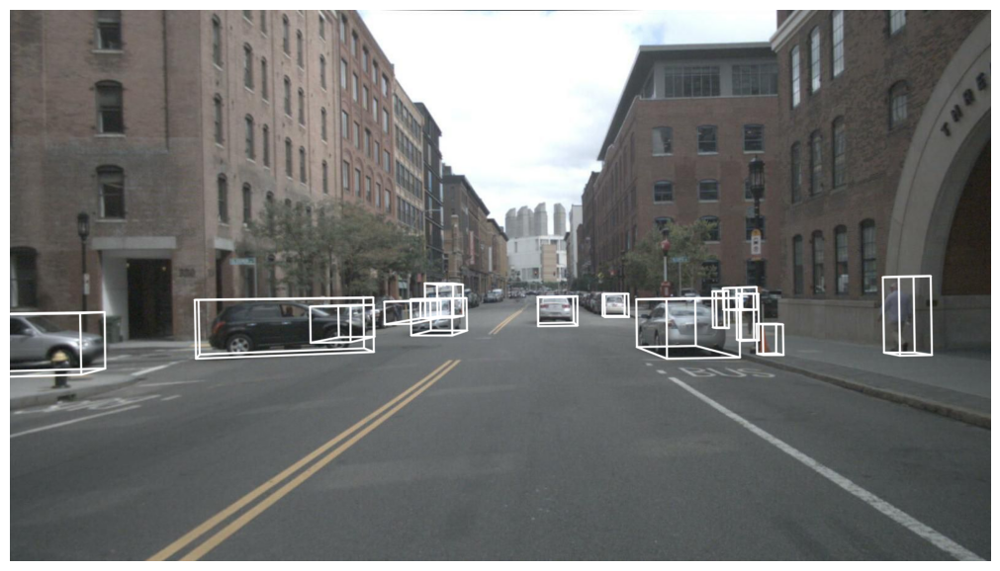

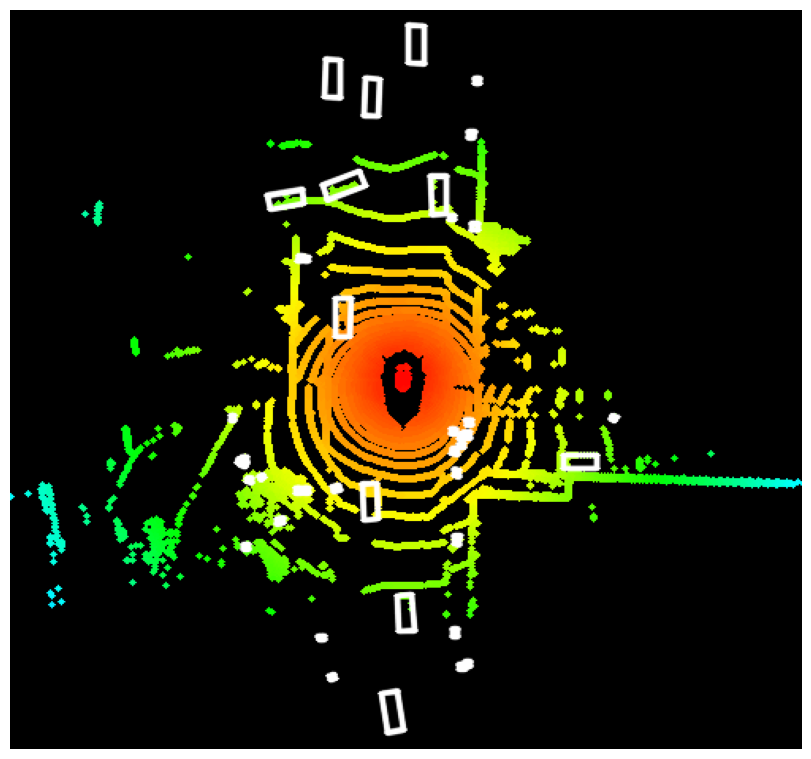

In [4]:
scene = 1
frame = 10
NDM = NSM.get_scene_dataset_by_index(scene)
objs = view_ego_data(NDM, frame, flipx=False, flipy=True, flipxy=False)

## Carla

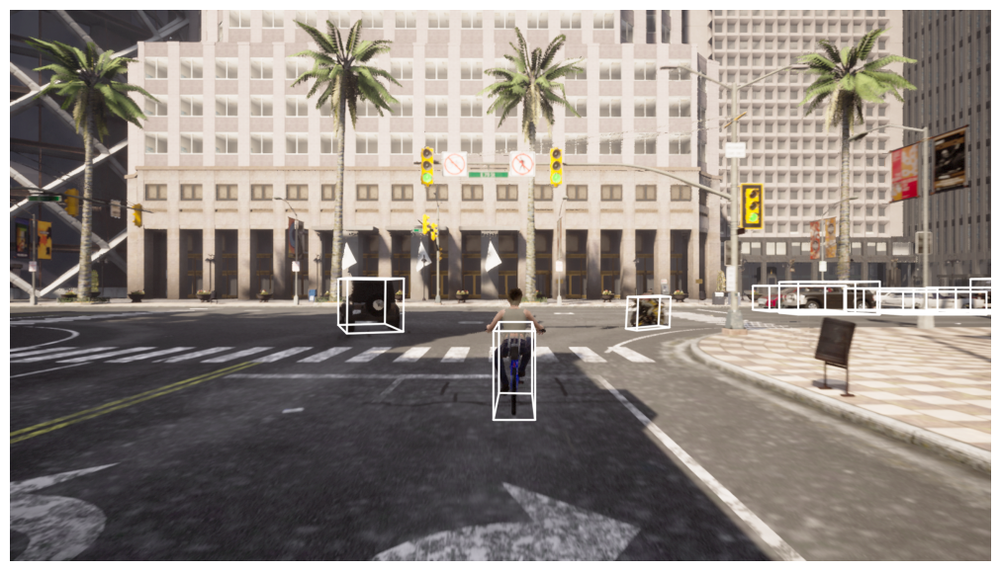

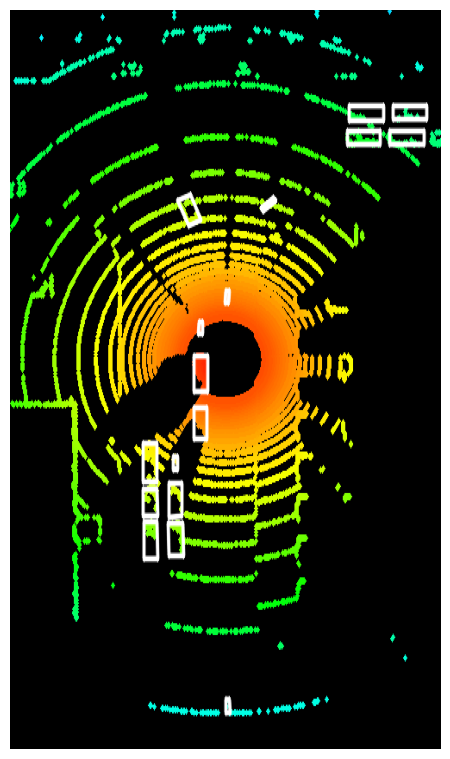

In [5]:
scene = 0
frame = 190
CDM = CSM.get_scene_dataset_by_index(scene)
objs = view_ego_data(CDM, frame, flipx=True, flipy=True, flipxy=True)

## Carla Collaborative

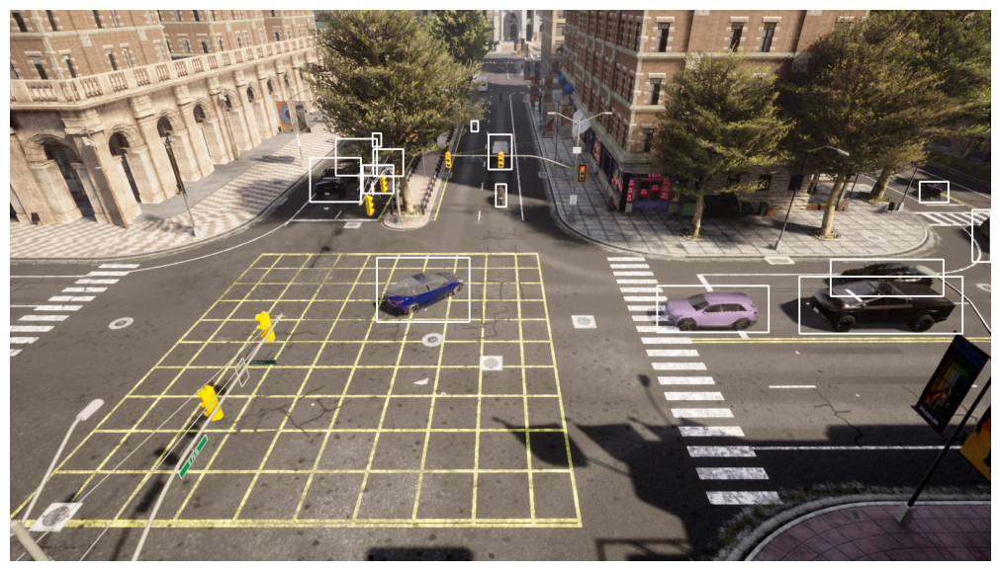

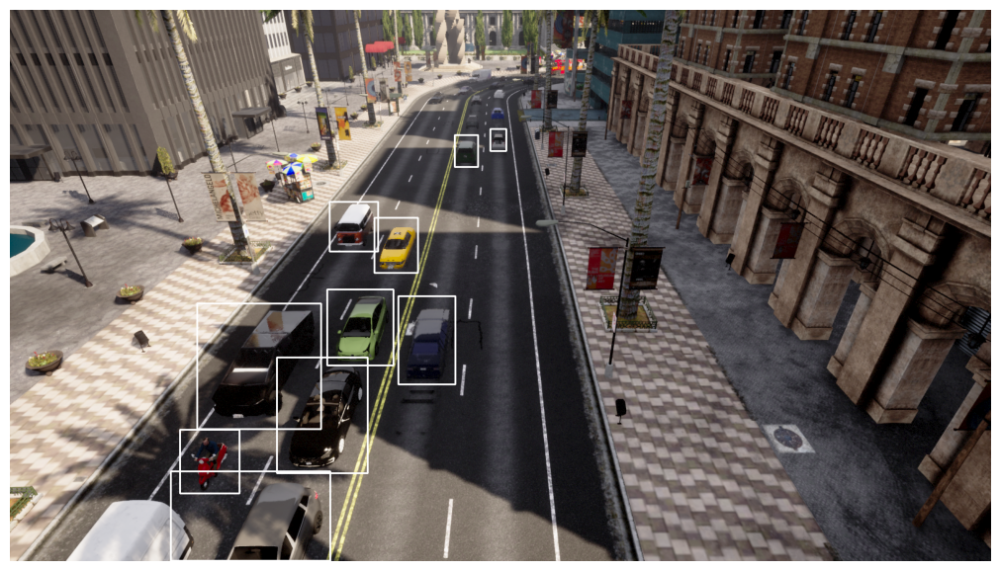

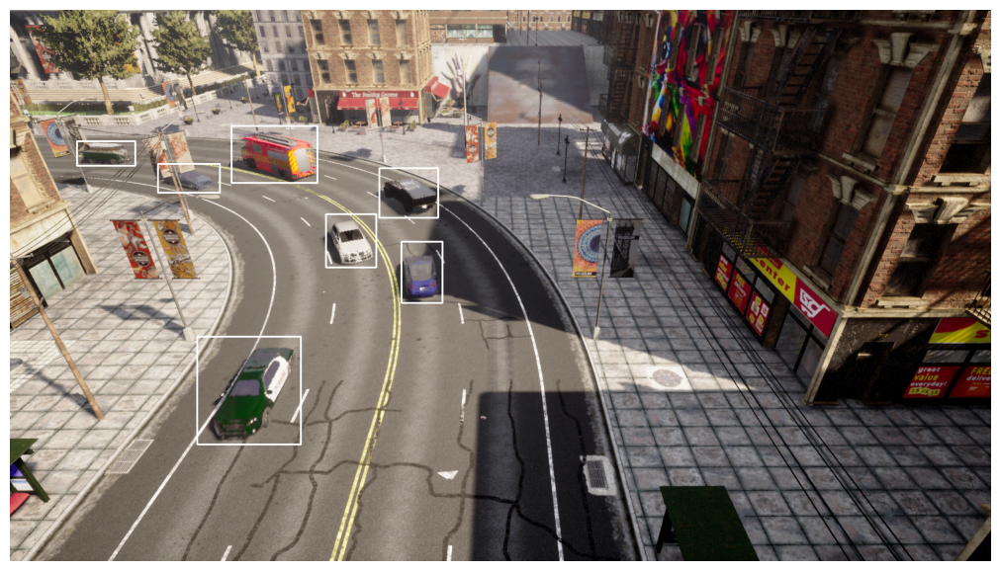

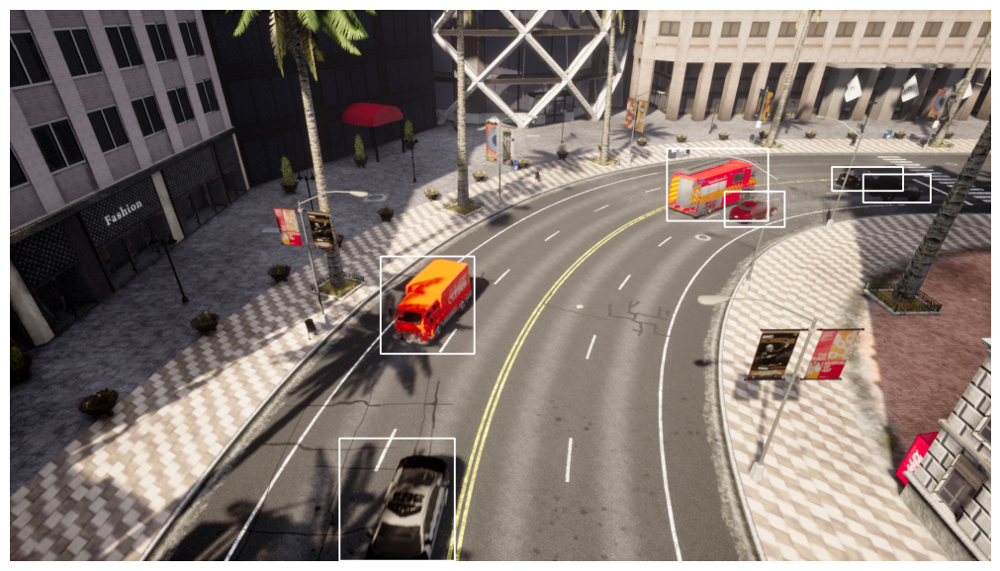

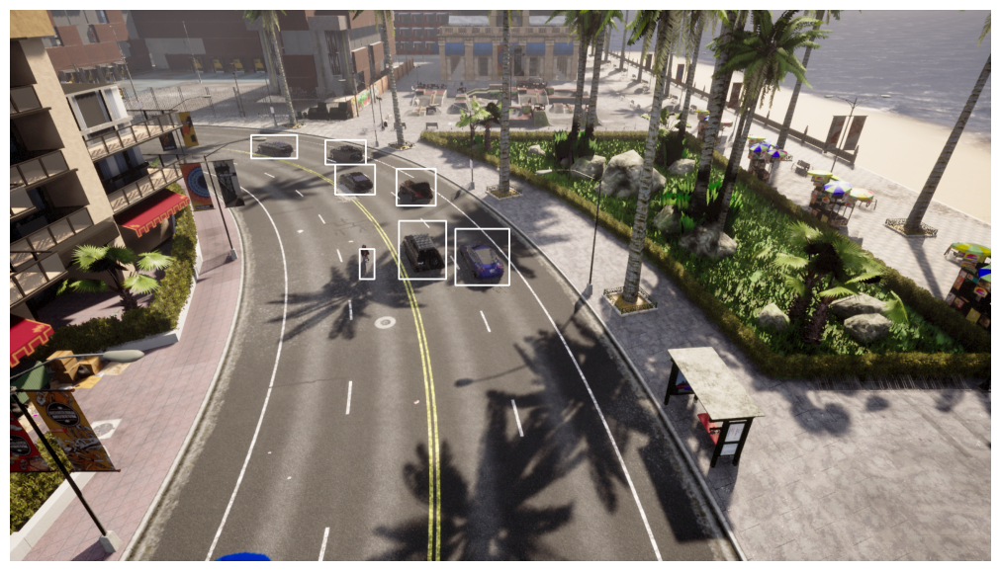

In [11]:
SD = CSM_collab.get_scene_dataset_by_index(0)
for cam_inf in ['CAM_INFRASTRUCTURE_00{}'.format(i) for i in range(1,6)]:
    img = SD.get_image(frame, sensor=cam_inf)
    objs_2d = [obj.box.project_to_2d_bbox(img.calibration) for obj in SD.get_objects(frame, sensor=cam_inf)]
    avapi.visualize.show_image_with_boxes(img, objs_2d, inline=True, box_colors='white')